In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats
import joblib
from joblib import load
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split

from sklearn.model_selection import cross_val_score
from sklearn.model_selection import validation_curve

from sklearn.ensemble import RandomForestRegressor

from itertools import product


from xgboost import XGBRegressor
from sklearn.model_selection import GridSearchCV, RepeatedKFold, RandomizedSearchCV
import multiprocessing

from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report, accuracy_score,roc_auc_score, roc_curve

from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
import lightgbm as lgb
from sklearn.metrics import precision_score, recall_score, f1_score
from sklearn.model_selection import ParameterGrid
import sklearn.metrics as metrics

from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

import statsmodels.api as sm
import statsmodels.formula.api as smf
from sklearn.impute import SimpleImputer

from imblearn.combine import SMOTEENN
from imblearn.combine import SMOTETomek

import pickle  # Para cargar el modelo guardado

### (PARENTESIS)

from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier


## 1. Carga de datos

In [3]:

data = pd.read_csv('df_con_grid.csv')


### Crear variables

In [4]:

# Definir la normalización de las variables


#Consideramos que el riesgo aumenta conforme la temperatura se aleja de un valor seguro, 
# por ejemplo, 30°C. A partir de los 40°C ya el riesgo se vuelve muy alto.
def Temperatura_normalizada(temperature):
    return max(0, min(1, (temperature - 30) / (40 - 30)))

#El riesgo de incendio crece cuando la humedad es muy baja. 
# Consideramos que la humedad es más peligrosa por debajo de un 30%.
def Humedad_normalizada(humidity):
    return max(0, min(1, (30 - humidity) / 30))

#La velocidad del viento también tiene un impacto importante. 
# Por ejemplo, un viento superior a 30 km/h puede hacer que un incendio se propague rápidamente.
def Viento_normalizado(wind_speed):
    return max(0, min(1, (wind_speed - 30) / (60 - 30)))

# Crear la nueva variable 'fire_risk_index' con la fórmula ponderada segun la importancia relativa que he considerado 
# donde he dado menos importancia al la velocidad del viendo que las otras dos variables T y H
def calculate_fire_risk(row):
    Temperature = Temperatura_normalizada(row['Temperature (C)']) 
    Humedad = Humedad_normalizada(row['Humidity (%)']) 
    Viento = Viento_normalizado(row['V_VIENTO']) 
    
    # Índice ponderado 30/30/30
    fire_risk_index = 0.4 * Temperature + 0.4 * Humedad + 0.2 * Viento
    
    return fire_risk_index

# Crear la nueva columna en el DataFrame
data['fire_risk_index'] = data.apply(calculate_fire_risk, axis=1)

# Guardar el DataFrame actualizado en un nuevo archivo CSV
output_file = 'df_con_grid_fire.csv'  #
data.to_csv(output_file, index=False)

print(f"Índice de riesgo de incendio calculado y guardado en '{output_file}'")


Índice de riesgo de incendio calculado y guardado en 'df_con_grid_fire.csv'


In [5]:
# Feature 1: 
data['difficulty_viento_humedad'] = data['DifficultyIndex'] * (data['V_VIENTO'] + data['Humidity (%)'])

# Feature 2:
data['fire_risk_fuel'] = data['fire_risk_index'] * (data['FuelLoadIndex'] / 100)

# Feature 3: 
data['fire_risk_landcover'] = data['fire_risk_index'] * data['LandCover']


output_file = 'df_con_grid_fire.csv'  #
data.to_csv(output_file, index=False)

print(f"Índice de riesgo de incendio calculado y guardado en '{output_file}'")

Índice de riesgo de incendio calculado y guardado en 'df_con_grid_fire.csv'


Creo a continuacion las variables de tipo clase para predecir si hay que madar o no aviones, buldozzer o helicopteros

In [6]:

data = pd.read_csv('df_con_grid_fire.csv')

In [7]:


def AvionAnfibio(range_str):
    if range_str == 0:
        return 0
    
    else:
        return 1


data['AVIANFNUM_CLASS'] = data['AVIANFNUM'].apply(AvionAnfibio)

In [8]:
def AvionTerre(range_str):
    if range_str == 0:
        return 0
    
    else:
        return 1


data['AVICARNUM_CLASS'] = data['AVICARNUM'].apply(AvionTerre)

In [9]:
def map_buldozzer(range_str):
    if range_str == 0:
        return 0
    
    else:
        return 1


data['BULDOZZER_CLASS'] = data['BULDOZZER'].apply(map_buldozzer)

data[['BULDOZZER_CLASS', 'BULDOZZER']].value_counts()

BULDOZZER_CLASS  BULDOZZER
0                0            10471
1                1               34
                 2               12
                 3                5
                 25               2
                 5                1
                 10               1
Name: count, dtype: int64

In [10]:
def map_AUTOBOMBA(range_str):
    if range_str == 0:
        return 0
    
    else:
        return 1


data['AUTOBOMBA_CLASS'] = data['AUTOBOMBA'].apply(map_AUTOBOMBA)

## 2. Filtrar datos

Se eliminan los datos que no pertenecen a la comunidad valenciana y que son dependientes de de la longuitud y la latitud.
Alguno de los datos que quedan pueden ser de otra comunidad dado que limitamos en cuadrado y la comunidad valenciana no es un rectangulo si no que tiene entradas y salidad del terreno

In [11]:
data = data.replace({',': ''}, regex=True)



Datos originales: (10526, 168)
Datos filtrados: (10526, 168)


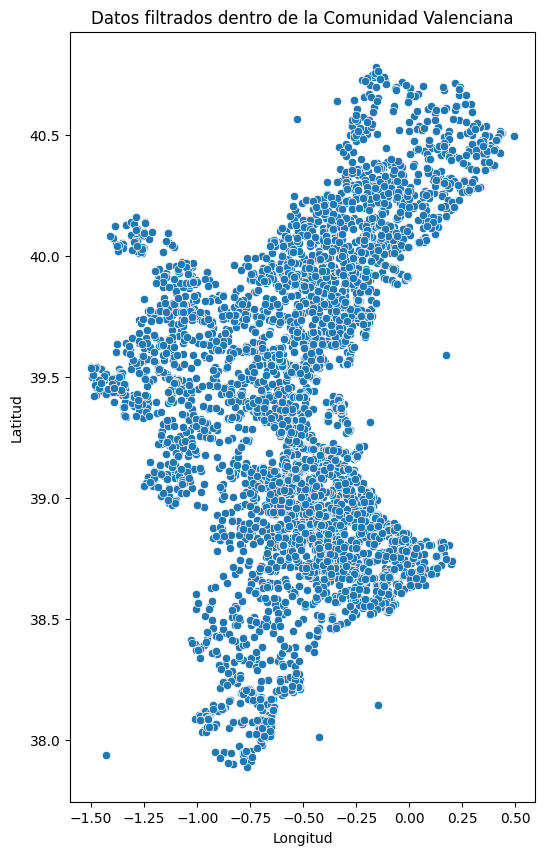

In [12]:
# Se incluyen unicamente los datos que estan dentro de las coordenadas correctas de la comunidad valenciana
data_filtrado = data[
    (data['Latitude'] <= 42) & (data['Latitude'] >= 36) &  # Latitude
    
    (data['Longitude'] <= 0.6) & (data['Longitude'] >= -1.7)  # Longitude
]

print(f"Datos originales: {data.shape}")
print(f"Datos filtrados: {data_filtrado.shape}")

# Gráfico
plt.figure(figsize=(6,10))
sns.scatterplot(data=data_filtrado, x='Longitude', y='Latitude')
plt.title("Datos filtrados dentro de la Comunidad Valenciana")
plt.xlabel("Longitud")
plt.ylabel("Latitud")
plt.show()


# AutoBOMBA

In [315]:

X = data_filtrado[['COMARCA','CS_ELEC','DifficultyIndex','D_APIE','D_VIENTO','DTORMENTA','DULLUVIA',
             'EROSION','ESTACION','Elevation','fire_risk_index', 'FuelLoadIndex','Humidity (%)','HOJA','IND_PEL','LandCover',
             'MOD_COM','PART_ASOC','Slope','Temperature (C)','V_VIENTO','X','Y','fire_risk_landcover',
             'fire_risk_fuel','difficulty_viento_humedad']]
y = data_filtrado[ 'AUTOBOMBA_CLASS']


In [316]:
model = RandomForestClassifier(random_state=42)
model.fit(X, y)

RandomForestClassifier(random_state=42)

Miro la importancia y entonces quito los ultimos que considera que tiene menos importancia para el modelo. Aunque vamos a hacer un Random forest y esto no afecta tanto como en uno lineal, quiro reducir la el tiempo de computo

In [317]:
importance = model.feature_importances_
importance_df = pd.DataFrame({'Feature': X.columns, 'Importance': importance}).sort_values(by='Importance', ascending=False)
print(importance_df)




                      Feature  Importance
25  difficulty_viento_humedad    0.090061
12               Humidity (%)    0.089587
19            Temperature (C)    0.087801
22                          Y    0.071201
2             DifficultyIndex    0.067736
18                      Slope    0.066085
21                          X    0.062191
6                    DULLUVIA    0.051601
4                    D_VIENTO    0.050839
20                   V_VIENTO    0.046138
9                   Elevation    0.044477
0                     COMARCA    0.038870
3                      D_APIE    0.037591
16                    MOD_COM    0.034595
15                  LandCover    0.023212
14                    IND_PEL    0.023109
11              FuelLoadIndex    0.019622
23        fire_risk_landcover    0.017996
8                    ESTACION    0.017437
10            fire_risk_index    0.016281
7                     EROSION    0.014180
24             fire_risk_fuel    0.012492
13                       HOJA    0

## 4.Modelos Clasificacion: AUTOBOMBA

Primero tenemos que saber si necesitamos `1` o no `0` aviones ANFIBIOS DE DESCARGA

In [461]:

X = data_filtrado[['COMARCA','D_APIE','D_VIENTO','DULLUVIA','difficulty_viento_humedad',
             'ESTACION','FuelLoadIndex','fire_risk_landcover','Humidity (%)','IND_PEL','LandCover',
             'MOD_COM','PART_ASOC','Slope','Temperature (C)','V_VIENTO','X','Y']] 
y = data_filtrado['AUTOBOMBA_CLASS']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

Comprobar si el modelo es balanceado o no

In [462]:
data_filtrado['AUTOBOMBA_CLASS'].value_counts().unique

<bound method Series.unique of AUTOBOMBA_CLASS
1    8947
0    1579
Name: count, dtype: int64>

Random Forest - AUC: 0.6606, Accuracy: 0.8518
XGBoost - AUC: 0.6536, Accuracy: 0.8360
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 6246, number of negative: 1122
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000458 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2209
[LightGBM] [Info] Number of data points in the train set: 7368, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.847720 -> initscore=1.716828
[LightGBM] [Info] Start training from score 1.716828


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [21:08:04] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


LightGBM - AUC: 0.6681, Accuracy: 0.8474
CatBoost - AUC: 0.6778, Accuracy: 0.8547


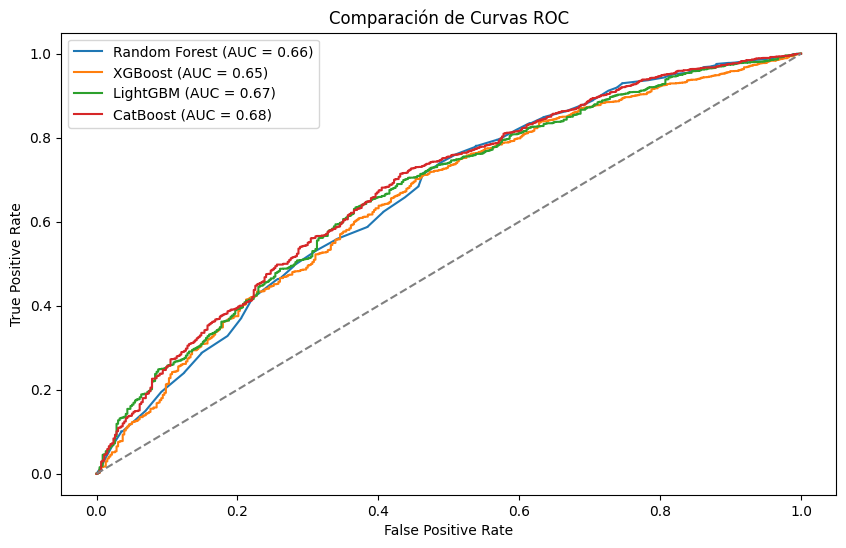

In [463]:

models = {
    "Random Forest": RandomForestClassifier(random_state=42),
    "XGBoost": XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42),
    "LightGBM": LGBMClassifier(random_state=42),
    "CatBoost": CatBoostClassifier(verbose=0, random_state=42)
}

# Entrenamiento y evaluación
results = {}
for name, model in models.items():
    # Entrenar el modelo
    model.fit(X_train, y_train)
    
    # Predicciones en el conjunto de prueba
    y_pred = model.predict(X_test)
    y_pred_proba = model.predict_proba(X_test)[:, 1]
    
    # Evaluación
    auc = roc_auc_score(y_test, y_pred_proba)
    accuracy = accuracy_score(y_test, y_pred)
    results[name] = {"AUC": auc, "Accuracy": accuracy}
    
    # Imprimir métricas
    print(f"{name} - AUC: {auc:.4f}, Accuracy: {accuracy:.4f}")

# Comparar las curvas ROC
plt.figure(figsize=(10, 6))
for name, model in models.items():
    y_pred_proba = model.predict_proba(X_test)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
    plt.plot(fpr, tpr, label=f"{name} (AUC = {results[name]['AUC']:.2f})")

# Línea base
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Comparación de Curvas ROC')
plt.legend()
plt.show()



### 4.1. Random forest Classifier 

In [464]:
forest = RandomForestClassifier (random_state=42,class_weight="balanced")

In [465]:
forest.fit(X_train,y_train)

RandomForestClassifier(class_weight='balanced', random_state=42)

In [466]:
print("Precisión sobre datos de pruebas: {:.4f}"
      .format(forest.score(X_test, y_test)))
print("Precisión sobre datos de train: {:.4f}"
      .format(forest.score(X_train, y_train)))

Precisión sobre datos de pruebas: 0.8531
Precisión sobre datos de train: 0.9992


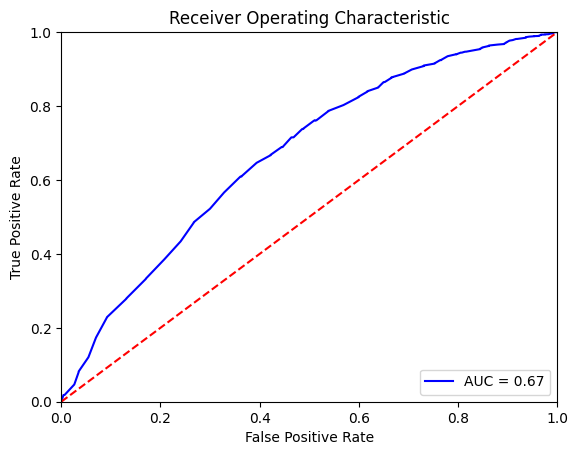

In [467]:
probs =forest.predict_proba(X_test)
preds = probs[:,1]
fpr, tpr, threshold = metrics.roc_curve(y_test, preds)
roc_auc = metrics.auc(fpr, tpr)

plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

In [469]:
predicciones = forest.predict(X = X_test)

mat_confusion = confusion_matrix(
                    y_true    = y_test,
                    y_pred    = predicciones
                )

accuracy = accuracy_score(
            y_true    = y_test,
            y_pred    = predicciones,
            normalize = True
           )

print("Matriz de confusión")
print(mat_confusion)
print("")
print(f"El accuracy de test es: {100 * accuracy} %")

print(
    classification_report(
        y_true = y_test,
        y_pred = predicciones
    )
)


Matriz de confusión
[[  26  431]
 [  33 2668]]

El accuracy de test es: 85.30715642811906 %
              precision    recall  f1-score   support

           0       0.44      0.06      0.10       457
           1       0.86      0.99      0.92      2701

    accuracy                           0.85      3158
   macro avg       0.65      0.52      0.51      3158
weighted avg       0.80      0.85      0.80      3158



In [330]:
param_range = [30,40,50,60,90,100,130,150,200,300,500]
train_score, test_score= validation_curve(
                                forest,
                                X = X_train, y = y_train, 
                                param_name = 'n_estimators', 
                               param_range=param_range,
                                scoring="accuracy")

In [1416]:
print("Numero de estimadores para un Cross_val 5 (test) y para todo dataset de entrenamiento (train)")
print ('n_estimators 30 en test:',test_score[0].mean(),'en train:',train_score[0].mean())
print ('n_estimators 40 en test:',test_score[1].mean(),'en train:',train_score[1].mean())
print ('n_estimators 50 en test:',test_score[2].mean(),'en train:',train_score[2].mean())
print ('n_estimators 60 en test:',test_score[3].mean(),'en train:',train_score[3].mean())
print ('n_estimators 90 en test:',test_score[4].mean(),'en train:',train_score[4].mean())
print ('n_estimators 100 en test:',test_score[5].mean(),'en train:',train_score[5].mean())
print ('n_estimators 130 en test:',test_score[6].mean(),'en train:',train_score[6].mean())
print ('n_estimators 150 en test:',test_score[7].mean(),'en train:',train_score[7].mean())
print ('n_estimators 200 en test:',test_score[8].mean(),'en train:',train_score[8].mean())
print ('n_estimators 300 en test:',test_score[9].mean(),'en train:',train_score[9].mean())
print ('n_estimators 500 en test:',test_score[10].mean(),'en train:',train_score[10].mean())

Numero de estimadores para un Cross_val 5 (test) y para todo dataset de entrenamiento (train)
n_estimators 30 en test: 0.8435135008165984 en train: 0.997692729887613
n_estimators 40 en test: 0.8460914276976533 en train: 0.9983374072855679
n_estimators 50 en test: 0.8450062223597804 en train: 0.9987106394478881
n_estimators 60 en test: 0.845141539110594 en train: 0.999219585593722
n_estimators 90 en test: 0.8466343527686508 en train: 0.9993553110896404
n_estimators 100 en test: 0.8460913355827785 en train: 0.9994231767157007
n_estimators 130 en test: 0.846226928678216 en train: 0.9994231709594985
n_estimators 150 en test: 0.8477198344511475 en train: 0.9994231709594985
n_estimators 200 en test: 0.8477201107957711 en train: 0.9994910365855588
n_estimators 300 en test: 0.8475845177003336 en train: 0.9994910365855588
n_estimators 500 en test: 0.8470417768590854 en train: 0.9994910365855588


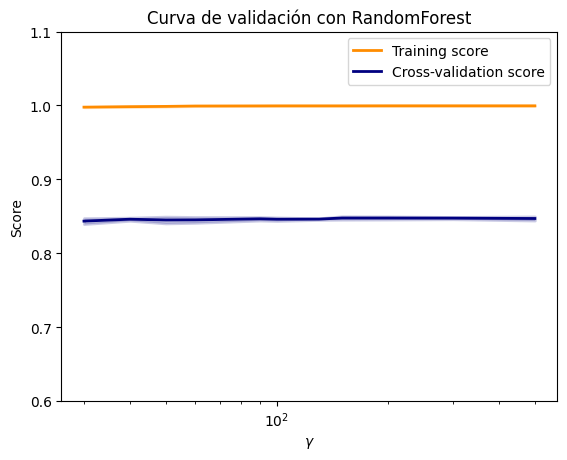

In [1417]:
train_scores_mean = np.mean(train_score, axis=1)
train_scores_std = np.std(train_score, axis=1)
test_scores_mean = np.mean(test_score, axis=1)
test_scores_std = np.std(test_score, axis=1)

plt.title("Curva de validación con RandomForest")
plt.xlabel(r"$\gamma$")
plt.ylabel("Score")
plt.ylim(0.6, 1.1)
lw = 2
plt.semilogx(param_range, train_scores_mean, label="Training score",
             color="darkorange", lw=lw)
plt.fill_between(param_range, train_scores_mean - train_scores_std,
                 train_scores_mean + train_scores_std, alpha=0.2,
                 color="darkorange", lw=lw)
plt.semilogx(param_range, test_scores_mean, label="Cross-validation score",
             color="navy", lw=lw)
plt.fill_between(param_range, test_scores_mean - test_scores_std,
                 test_scores_mean + test_scores_std, alpha=0.2,
                 color="navy", lw=lw)
plt.legend(loc="best")
plt.show()

In [470]:
# Numero de arboles del bosque
n_estimators = [int(x) for x in np.linspace(start = 30, stop = 250, num = 30)]

# Numero de caracteristicas proporcionadas a cada arbol
max_features = [1,2,3,4,5,6,7,8,9,10,11,12,13,14]
max_features.append('auto')

# Profundidad de arbol
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)

# Minimo valor para separar en subnodos
min_samples_split = [2, 5, 8, 10]

# Minimo numero de muestras necesarias en hoja despues de dividir
min_samples_leaf = [1, 2 ,3, 4, 5]

# Numero maximo de nodos finales
max_leaf_nodes = [int(x) for x in np.linspace(10, 100, num = 90)]
max_leaf_nodes.append(None)

# Cuadricula
param_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               "max_leaf_nodes": max_leaf_nodes}


In [471]:
forest_random = RandomizedSearchCV(estimator = forest, 
                                   param_distributions = param_grid, 
                                   n_iter = 30, 
                                   cv = 5, 
                                   scoring='roc_auc',
                                   verbose=1, 
                                   random_state=42, 
                                   n_jobs = 1)


In [472]:
forest_random.fit(X_train,y_train)

Fitting 5 folds for each of 30 candidates, totalling 150 fits


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/model_selection/_validation.py:528: FitFailedWarning: 
15 fits failed out of a total of 150.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
15 fits failed with the following error:
Traceback (most recent call last):
  File "/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/model_selection/_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/base.py", line 1382, in wrapper
    estimator._validate_params()
  File "/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/

RandomizedSearchCV(cv=5,
                   estimator=RandomForestClassifier(class_weight='balanced',
                                                    random_state=42),
                   n_iter=30, n_jobs=1,
                   param_distributions={'max_depth': [10, 20, 30, 40, 50, 60,
                                                      70, 80, 90, 100, 110,
                                                      None],
                                        'max_features': [1, 2, 3, 4, 5, 6, 7, 8,
                                                         9, 10, 11, 12, 13, 14,
                                                         'auto'],
                                        'max_leaf_nodes': [10, 11, 12, 13, 14,
                                                           15, 16, 17, 18, 19,
                                                           20, 21, 22, 23, 24,
                                                           25, 26, 27, 28, 29,
                                                           30, 31, 32, 33, 34,
                                                           35, 36, 37, 38, 39, ...],
                                        'min_samples_leaf': [1, 2, 3, 4, 5],
                                        'min_samples_split': [2, 5, 8, 10],
                                        'n_estimators': [30, 37, 45, 52, 60, 67,
                                                         75, 83, 90, 98, 105,
                                                         113, 121, 128, 136,
                                                         143, 151, 158, 166,
                                                         174, 181, 189, 196,
                                                         204, 212, 219, 227,
                                                         234, 242, 250]},
                   random_state=42, scoring='roc_auc', verbose=1)

In [473]:
best_forest = forest_random.best_estimator_

<BarContainer object of 18 artists>

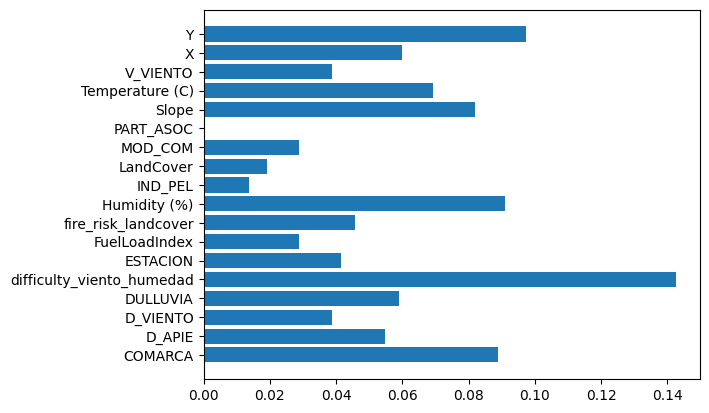

In [474]:
plt.barh(X.columns, best_forest.feature_importances_)

In [475]:
best_forest.fit(X_train,y_train)

RandomForestClassifier(class_weight='balanced', max_depth=60, max_features=4,
                       max_leaf_nodes=86, min_samples_leaf=2,
                       min_samples_split=5, n_estimators=196, random_state=42)

In [476]:
print('BALANCED_ BEST_PARAMS_')

print("Precisión sobre datos de pruebas: {:.4f}"
      .format(best_forest.score(X_test, y_test)))
print("Precisión sobre datos de train: {:.4f}"
      .format(best_forest.score(X_train, y_train)))

BALANCED_ BEST_PARAMS_
Precisión sobre datos de pruebas: 0.7413
Precisión sobre datos de train: 0.8031


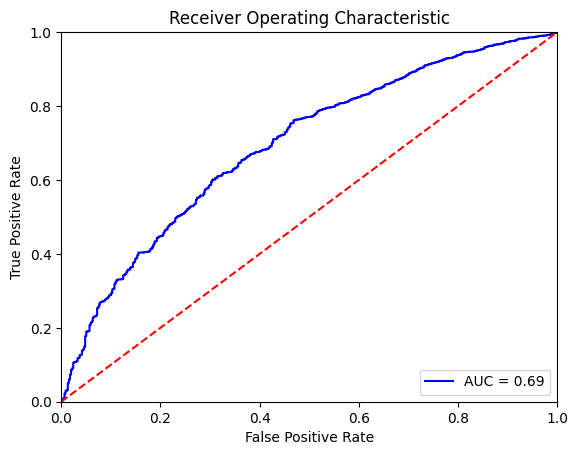

In [477]:
probs = best_forest.predict_proba(X_test)
preds = probs[:,1]
fpr, tpr, threshold = metrics.roc_curve(y_test, preds)
roc_auc = metrics.auc(fpr, tpr)

plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

In [478]:
predicciones = best_forest.predict(X = X_test)

mat_confusion = confusion_matrix(
                    y_true    = y_test,
                    y_pred    = predicciones
                )

accuracy = accuracy_score(
            y_true    = y_test,
            y_pred    = predicciones,
            normalize = True
           )

print("Matriz de confusión")
print(mat_confusion)
print("")
print(f"El accuracy de test es: {100 * accuracy} %")

print(
    classification_report(
        y_true = y_test,
        y_pred = predicciones
    )
)


Matriz de confusión
[[ 221  236]
 [ 581 2120]]

El accuracy de test es: 74.12919569347687 %
              precision    recall  f1-score   support

           0       0.28      0.48      0.35       457
           1       0.90      0.78      0.84      2701

    accuracy                           0.74      3158
   macro avg       0.59      0.63      0.59      3158
weighted avg       0.81      0.74      0.77      3158



In [479]:
#Rango umbrales en pasos pequeños
thresholds = np.arange(0.1, 1.0, 0.1)
precisions = []
recalls = []
f1_scores = []

# Metricas por umbral
for threshold in thresholds:
    y_pred_adjusted = (preds >= threshold).astype(int)  # Aplicar el umbral
    precisions.append(precision_score(y_test, y_pred_adjusted))
    recalls.append(recall_score(y_test, y_pred_adjusted))
    f1_scores.append(f1_score(y_test, y_pred_adjusted))

# resultados
for i, threshold in enumerate(thresholds):
    print(f"Umbral: {threshold:.1f}, Precision: {precisions[i]:.4f}, Recall: {recalls[i]:.4f}, F1-score: {f1_scores[i]:.4f}")

Umbral: 0.1, Precision: 0.8553, Recall: 1.0000, F1-score: 0.9220
Umbral: 0.2, Precision: 0.8554, Recall: 0.9985, F1-score: 0.9214
Umbral: 0.3, Precision: 0.8653, Recall: 0.9730, F1-score: 0.9160
Umbral: 0.4, Precision: 0.8807, Recall: 0.8941, F1-score: 0.8874
Umbral: 0.5, Precision: 0.8998, Recall: 0.7849, F1-score: 0.8384
Umbral: 0.6, Precision: 0.9163, Recall: 0.6205, F1-score: 0.7400
Umbral: 0.7, Precision: 0.9334, Recall: 0.4047, F1-score: 0.5646
Umbral: 0.8, Precision: 0.9506, Recall: 0.1355, F1-score: 0.2372
Umbral: 0.9, Precision: 0.8000, Recall: 0.0015, F1-score: 0.0030


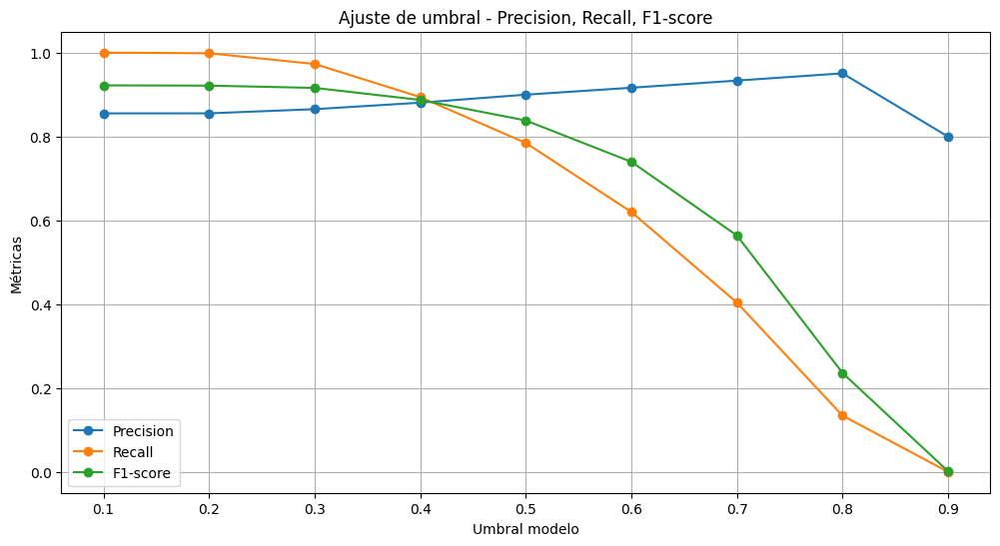

In [480]:
plt.figure(figsize=(12, 6))
plt.plot(thresholds, precisions, label='Precision', marker='o')
plt.plot(thresholds, recalls, label='Recall', marker='o')
plt.plot(thresholds, f1_scores, label='F1-score', marker='o')
plt.xlabel('Umbral modelo')
plt.ylabel('Métricas')
plt.title('Ajuste de umbral - Precision, Recall, F1-score')
plt.legend()
plt.grid(True)
plt.show()


In [481]:
# Coste de un falso positivo (enviar un avión innecesariamente)
cost_fp = 29.98*15  # Coste de enviar un avión segun los datos que tenemos en la introducción de coste hora.
# pongo un *15 porque es la media de las 3 provincias en la comunidad valenciana 

# Estimación del coste de un falso negativo (no enviar un avión cuando es necesario)
cost_fn = (6343*0.07) # Un valor extraido de las hectarias mediana (medias muy altas) quemadas en los datos obtenidos 
#y el coste medio de perdida medio ambiental segúnhttps://evenor-tech.com/el-coste-economico-de-los-incendios-forestales/

thresholds = np.arange(0.1, 1.0, 0.1)
total_costs = []

for threshold in thresholds:
    # Aplicar el umbral para hacer las predicciones ajustadas
    y_pred_adjusted = (preds >= threshold).astype(int)
    
    # Calculoo FP y FN
    false_positive = ((y_pred_adjusted == 1) & (y_test == 0)).sum()
    false_negative = ((y_pred_adjusted == 0) & (y_test == 1)).sum()

    # Coste total
    total_cost = (false_positive * cost_fp) + (false_negative * cost_fn)
    total_costs.append(total_cost)


for i, threshold in enumerate(thresholds):
    print(f"Umbral: {threshold:.1f}, Coste total: {total_costs[i]:.2f} €")


Umbral: 0.1, Coste total: 205512.90 €
Umbral: 0.2, Coste total: 206839.24 €
Umbral: 0.3, Coste total: 216340.03 €
Umbral: 0.4, Coste total: 274038.76 €
Umbral: 0.5, Coste total: 364099.01 €
Umbral: 0.6, Coste total: 523914.35 €
Umbral: 0.7, Coste total: 749044.68 €
Umbral: 0.8, Coste total: 1045307.65 €
Umbral: 0.9, Coste total: 1197944.67 €


In [499]:
# Ajuste umbral
threshold = 0.45
y_pred_adjusted = (preds  >= threshold).astype(int)

In [500]:
print(confusion_matrix(y_test, y_pred_adjusted))

print(classification_report(y_test, y_pred_adjusted))


[[ 167  290]
 [ 417 2284]]
              precision    recall  f1-score   support

           0       0.29      0.37      0.32       457
           1       0.89      0.85      0.87      2701

    accuracy                           0.78      3158
   macro avg       0.59      0.61      0.59      3158
weighted avg       0.80      0.78      0.79      3158



In [501]:
filename = '../Modelos/Autobomba/best_forest_AUTOBOMBA.pkl'

In [502]:
model_and_threshold = {
    'model': best_forest,
    'threshold': threshold}

    
joblib.dump(model_and_threshold, filename)

['../Modelos/Autobomba/best_forest_AUTOBOMBA.pkl']

### 4.2 Gradient Boosting

In [ ]:

X = data_filtrado[['COMARCA','CS_ELEC','DifficultyIndex','D_APIE','D_VIENTO','DTORMENTA','DULLUVIA',
             'EROSION','ESTACION','Elevation','fire_risk_index', 'FuelLoadIndex','Humidity (%)','HOJA','IND_PEL','LandCover',
             'MOD_COM','PART_ASOC','Slope','Temperature (C)','V_VIENTO','X','Y','fire_risk_landcover',
             'fire_risk_fuel','difficulty_viento_humedad']] 
y = data_filtrado['AUTOBOMBA_CLASS']


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [414]:
lgb_clf =lgb.LGBMClassifier(random_state=42, class_weight='balanced')

In [415]:
lgb_clf.fit(X_train,y_train)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 6246, number of negative: 1122
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000499 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2209
[LightGBM] [Info] Number of data points in the train set: 7368, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000


LGBMClassifier(class_weight='balanced', random_state=42)

In [1453]:

importance = lgb_clf.feature_importances_
importance_df = pd.DataFrame({'Feature': X.columns, 'Importance': importance}).sort_values(by='Importance', ascending=False)
print(importance_df)


                      Feature  Importance
12               Humidity (%)         291
19            Temperature (C)         262
25  difficulty_viento_humedad         250
21                          X         222
18                      Slope         213
6                    DULLUVIA         201
9                   Elevation         179
22                          Y         168
2             DifficultyIndex         149
4                    D_VIENTO         149
20                   V_VIENTO         114
0                     COMARCA         114
3                      D_APIE         101
15                  LandCover          84
11              FuelLoadIndex          80
16                    MOD_COM          80
23        fire_risk_landcover          68
24             fire_risk_fuel          66
8                    ESTACION          53
14                    IND_PEL          51
10            fire_risk_index          46
7                     EROSION          42
13                       HOJA     

In [503]:

X = data_filtrado[['COMARCA','D_APIE','D_VIENTO','DULLUVIA','difficulty_viento_humedad',
             'ESTACION','FuelLoadIndex','fire_risk_landcover','Humidity (%)','IND_PEL','LandCover',
             'MOD_COM','PART_ASOC','Slope','Temperature (C)','V_VIENTO','X','Y']] 
y = data_filtrado['AUTOBOMBA_CLASS']


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

Tengo error que no me permite el poder hacer le modelo por lo tanto lo que hago es intentar anular ese error haciendo que los objetos se conviertan en int o float

In [504]:

object_columns = X_train.select_dtypes(include=['object']).columns
print("Columnas con dtype object:", object_columns)

# Convertir a numérico (si los valores son realmente números)
for col in object_columns:
    X_train[col] = pd.to_numeric(X_train[col], errors='coerce')
    X_test[col] = pd.to_numeric(X_test[col], errors='coerce')

print(X_train.dtypes)

Columnas con dtype object: Index([], dtype='object')
COMARCA                        int64
D_APIE                         int64
D_VIENTO                       int64
DULLUVIA                       int64
difficulty_viento_humedad    float64
ESTACION                       int64
FuelLoadIndex                float64
fire_risk_landcover          float64
Humidity (%)                 float64
IND_PEL                        int64
LandCover                    float64
MOD_COM                        int64
PART_ASOC                      int64
Slope                        float64
Temperature (C)              float64
V_VIENTO                       int64
X                            float64
Y                            float64
dtype: object


In [505]:
X_train['COMARCA'].mean()


2610.910016286645

In [506]:
lgb_clf.fit(X_train,y_train)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 6246, number of negative: 1122
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000669 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2209
[LightGBM] [Info] Number of data points in the train set: 7368, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000


LGBMClassifier(class_weight='balanced', random_state=42)

In [508]:
print("Precisión sobre el juego de pruebas: {:.4f}"
      .format(lgb_clf.score(X_test, y_test)))
print("Precisión sobre el juego de train: {:.4f}"
      .format(lgb_clf.score(X_train, y_train)))

Precisión sobre el juego de pruebas: 0.7375
Precisión sobre el juego de train: 0.8734


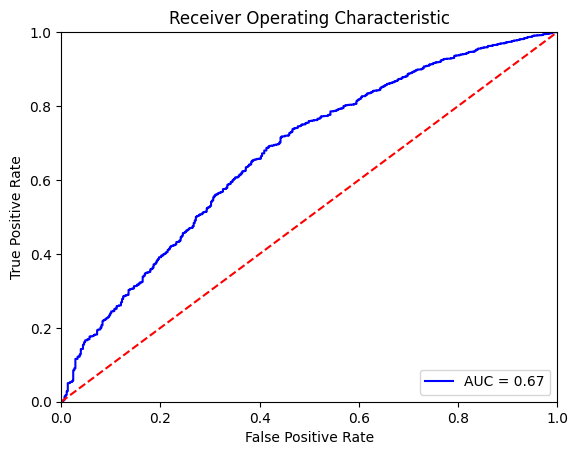

In [510]:
probs = lgb_clf.predict_proba(X_test)
preds = probs[:,1]
fpr, tpr, threshold = metrics.roc_curve(y_test, preds)
roc_auc = metrics.auc(fpr, tpr)

plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

In [511]:
predicciones = lgb_clf.predict(X = X_test)

mat_confusion = confusion_matrix(
                    y_true    = y_test,
                    y_pred    = predicciones
                )

accuracy = accuracy_score(
            y_true    = y_test,
            y_pred    = predicciones,
            normalize = True
           )

print("Matriz de confusión")
print(mat_confusion)
print("")
print(f"El accuracy de test es: {100 * accuracy} %")

print(
    classification_report(
        y_true = y_test,
        y_pred = predicciones
    )
)


Matriz de confusión
[[ 207  250]
 [ 579 2122]]

El accuracy de test es: 73.74920835972134 %
              precision    recall  f1-score   support

           0       0.26      0.45      0.33       457
           1       0.89      0.79      0.84      2701

    accuracy                           0.74      3158
   macro avg       0.58      0.62      0.58      3158
weighted avg       0.80      0.74      0.76      3158



In [512]:
param_range = [20,60,90,100,150,200,250,300,400,500]
train_score, test_score= validation_curve(
                                lgb_clf,
                                X = X_train, y = y_train, 
                                param_name = 'n_estimators', 
                               param_range=param_range,
                                scoring="accuracy")

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4996, number of negative: 898
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000574 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2187
[LightGBM] [Info] Number of data points in the train set: 5894, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4996, number of negative: 898
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000319 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=t

In [1464]:
print("Numero de estimadores para un Cross_val 5 (test) y para todo dataset de entrenamiento (train)")
print ('n_estimators 10 en test:',test_score[0].mean(),'en train :',train_score[0].mean())
print ('n_estimators 60 en test:',test_score[1].mean(),'en train:',train_score[1].mean())
print ('n_estimators 90 en test:',test_score[2].mean(),'en train:',train_score[2].mean())
print ('n_estimators 100 en test:',test_score[3].mean(),'en train:',train_score[3].mean())
print ('n_estimators 150 en test:',test_score[4].mean(),'en train:',train_score[4].mean())
print ('n_estimators 200 en test:',test_score[5].mean(),'en train:',train_score[5].mean())
print ('n_estimators 250 en test:',test_score[6].mean(),'en train:',train_score[6].mean())
print ('n_estimators 300 en test:',test_score[7].mean(),'en train:',train_score[7].mean())
print ('n_estimators 400 en test:',test_score[8].mean(),'en train:',train_score[8].mean())
print ('n_estimators 500 en test:',test_score[9].mean(),'en train:',train_score[9].mean())

Numero de estimadores para un Cross_val 5 (test) y para todo dataset de entrenamiento (train)
n_estimators 10 en test: 0.689741719103059 en train : 0.7565148900004115
n_estimators 60 en test: 0.7232627825508635 en train: 0.8473469979821633
n_estimators 90 en test: 0.746334703081519 en train: 0.8900652839692931
n_estimators 100 en test: 0.7516290976150538 en train: 0.9026195037980862
n_estimators 150 en test: 0.774431305792828 en train: 0.9423520418544988
n_estimators 200 en test: 0.7856956653503452 en train: 0.968274897805822
n_estimators 250 en test: 0.797638543074297 en train: 0.9813382307103182
n_estimators 300 en test: 0.8033385194007743 en train: 0.9900923323642766
n_estimators 400 en test: 0.810531585729932 en train: 0.9969462425381629
n_estimators 500 en test: 0.8163675236113452 en train: 0.9988463534314018


In [513]:
boosting_type = ['gbdt','dart']
#Numero de Hojas máximas por árboles
num_leaves = [int(x) for x in np.linspace(30, 110, num = 9)]

# Profundidad de arbol
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)

#Learning rate
learning_rate = [round (float(x), 2) for x in np.linspace(0.1, 1., num = 10)]
learning_rate.append(0.005)
learning_rate = sorted(learning_rate)

# Numero de arboles del bosque
n_estimators = [int(x) for x in np.linspace(start = 100, stop = 1000, num = 100)]

# Número de muestras para la construcción de contenedores
subsample_for_bin =  list(range(20000, 300000, 20000))

# Reducción mínima de pérdidas para realizar una nueva partición en un nodo del árbol.
min_split_gain =  [0.0,0.2,0.4,0.6,0.8]

#Número mínimo de datos necesarios en una hoja
min_child_samples = [int(x) for x in np.linspace(1, 40, num = 10)]

# reg_alpha
reg_alpha = [round (float(x), 2) for x in np.linspace(0.0, 1., num = 11)]
# reg_lambda
reg_lambda = [round (float(x), 2)  for x in np.linspace(0.0, 1., num = 11)]
# Creacion de cuadrícula aleatoria
param_grid = {'boosting_type':boosting_type,
              'num_leaves': num_leaves,
              'max_depth': max_depth,
              'learning_rate': learning_rate,
              'n_estimators': n_estimators,
              'subsample_for_bin': subsample_for_bin,
              'min_split_gain': min_split_gain,
              'min_child_samples':min_child_samples,
              'reg_alpha':reg_alpha,
              'reg_lambda':reg_lambda}
print(param_grid)

{'boosting_type': ['gbdt', 'dart'], 'num_leaves': [30, 40, 50, 60, 70, 80, 90, 100, 110], 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None], 'learning_rate': [0.005, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0], 'n_estimators': [100, 109, 118, 127, 136, 145, 154, 163, 172, 181, 190, 200, 209, 218, 227, 236, 245, 254, 263, 272, 281, 290, 300, 309, 318, 327, 336, 345, 354, 363, 372, 381, 390, 400, 409, 418, 427, 436, 445, 454, 463, 472, 481, 490, 500, 509, 518, 527, 536, 545, 554, 563, 572, 581, 590, 600, 609, 618, 627, 636, 645, 654, 663, 672, 681, 690, 700, 709, 718, 727, 736, 745, 754, 763, 772, 781, 790, 800, 809, 818, 827, 836, 845, 854, 863, 872, 881, 890, 900, 909, 918, 927, 936, 945, 954, 963, 972, 981, 990, 1000], 'subsample_for_bin': [20000, 40000, 60000, 80000, 100000, 120000, 140000, 160000, 180000, 200000, 220000, 240000, 260000, 280000], 'min_split_gain': [0.0, 0.2, 0.4, 0.6, 0.8], 'min_child_samples': [1, 5, 9, 14, 18, 22, 27, 31, 35, 40], 'reg_alpha':

In [514]:
light_gbm_random = RandomizedSearchCV(estimator = lgb_clf, 
                                   param_distributions = param_grid, 
                                   n_iter = 50, 
                                   cv = 5, 
                                   scoring='roc_auc',
                                   verbose=1, 
                                   random_state=42, 
                                   n_jobs = 1)

In [515]:
light_gbm_random.fit(X_train, y_train)

Fitting 5 folds for each of 50 candidates, totalling 250 fits
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4996, number of negative: 898
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000378 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2187
[LightGBM] [Info] Number of data points in the train set: 5894, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Light

RandomizedSearchCV(cv=5,
                   estimator=LGBMClassifier(class_weight='balanced',
                                            random_state=42),
                   n_iter=50, n_jobs=1,
                   param_distributions={'boosting_type': ['gbdt', 'dart'],
                                        'learning_rate': [0.005, 0.1, 0.2, 0.3,
                                                          0.4, 0.5, 0.6, 0.7,
                                                          0.8, 0.9, 1.0],
                                        'max_depth': [10, 20, 30, 40, 50, 60,
                                                      70, 80, 90, 100, 110,
                                                      None],
                                        'min_child_samples': [1, 5, 9, 14, 18,
                                                              22, 27, 31, 35,
                                                              40],
                                        'min_split_gain': [0.0...
                                                         318, 327, 336, 345,
                                                         354, 363, ...],
                                        'num_leaves': [30, 40, 50, 60, 70, 80,
                                                       90, 100, 110],
                                        'reg_alpha': [0.0, 0.1, 0.2, 0.3, 0.4,
                                                      0.5, 0.6, 0.7, 0.8, 0.9,
                                                      1.0],
                                        'reg_lambda': [0.0, 0.1, 0.2, 0.3, 0.4,
                                                       0.5, 0.6, 0.7, 0.8, 0.9,
                                                       1.0],
                                        'subsample_for_bin': [20000, 40000,
                                                              60000, 80000,
                                                              100000, 120000,
                                                              140000, 160000,
                                                              180000, 200000,
                                                              220000, 240000,
                                                              260000, 280000]},
                   random_state=42, scoring='roc_auc', verbose=1)

In [516]:
best_light_gbm = light_gbm_random.best_estimator_

<BarContainer object of 18 artists>

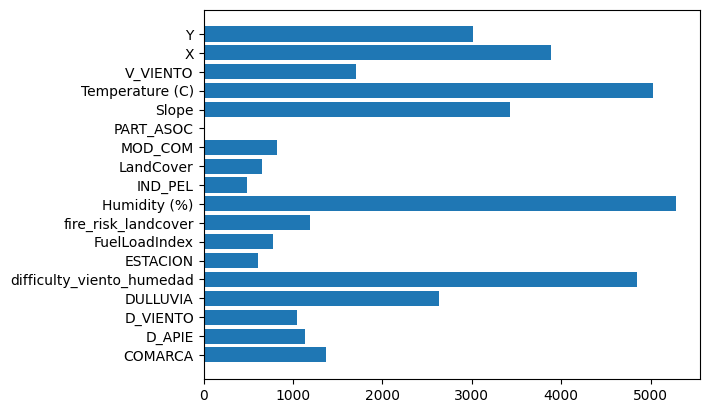

In [517]:
plt.barh(X.columns, best_light_gbm.feature_importances_)

In [518]:
best_light_gbm.fit(X_train,y_train)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 6246, number of negative: 1122
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000801 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2209
[LightGBM] [Info] Number of data points in the train set: 7368, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

LGBMClassifier(boosting_type='dart', class_weight='balanced', max_depth=20,
               min_child_samples=40, min_split_gain=0.8, n_estimators=981,
               num_leaves=50, random_state=42, reg_alpha=1.0, reg_lambda=0.3,
               subsample_for_bin=240000)

In [519]:
print('BALANCED_ BEST_PARAMS_')

print("Precisión sobre el juego de test: {:.4f}"
      .format(best_light_gbm.score(X_test, y_test)))
print("Precisión sobre el juego de train: {:.4f}"
      .format(best_light_gbm.score(X_train, y_train)))

BALANCED_ BEST_PARAMS_
Precisión sobre el juego de test: 0.7438
Precisión sobre el juego de train: 0.8964


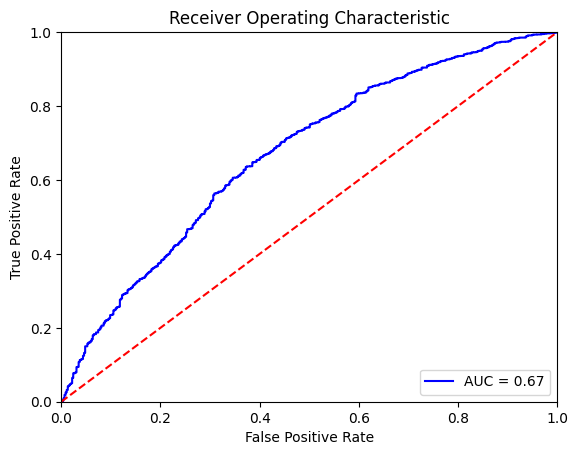

In [520]:
probs = best_light_gbm.predict_proba(X_test)
preds = probs[:,1]
fpr, tpr, threshold = metrics.roc_curve(y_test, preds)
roc_auc = metrics.auc(fpr, tpr)

plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

In [521]:
predicciones = best_light_gbm.predict(X = X_test)

mat_confusion = confusion_matrix(
                    y_true    = y_test,
                    y_pred    = predicciones
                )

accuracy = accuracy_score(
            y_true    = y_test,
            y_pred    = predicciones,
            normalize = True
           )

print("Matriz de confusión")
print(mat_confusion)
print("")
print(f"El accuracy de test es: {100 * accuracy} %")

print(
    classification_report(
        y_true = y_test,
        y_pred = predicciones
    )
)


Matriz de confusión
[[ 195  262]
 [ 547 2154]]

El accuracy de test es: 74.38252058264725 %
              precision    recall  f1-score   support

           0       0.26      0.43      0.33       457
           1       0.89      0.80      0.84      2701

    accuracy                           0.74      3158
   macro avg       0.58      0.61      0.58      3158
weighted avg       0.80      0.74      0.77      3158



In [525]:
#Rango umbrales en pasos pequeños
thresholds = np.arange(0.1, 1.0, 0.1)
precisions = []
recalls = []
f1_scores = []

# Metricas por umbral
for threshold in thresholds:
    y_pred_adjusted = (preds >= threshold).astype(int)  # Aplicar el umbral
    precisions.append(precision_score(y_test, y_pred_adjusted))
    recalls.append(recall_score(y_test, y_pred_adjusted))
    f1_scores.append(f1_score(y_test, y_pred_adjusted))

# resultados
for i, threshold in enumerate(thresholds):
    print(f"Umbral: {threshold:.1f}, Precision: {precisions[i]:.4f}, Recall: {recalls[i]:.4f}, F1-score: {f1_scores[i]:.4f}")


Umbral: 0.1, Precision: 0.8552, Recall: 0.9993, F1-score: 0.9216
Umbral: 0.2, Precision: 0.8616, Recall: 0.9907, F1-score: 0.9216
Umbral: 0.3, Precision: 0.8689, Recall: 0.9545, F1-score: 0.9097
Umbral: 0.4, Precision: 0.8809, Recall: 0.8956, F1-score: 0.8882
Umbral: 0.5, Precision: 0.8916, Recall: 0.7975, F1-score: 0.8419
Umbral: 0.6, Precision: 0.9036, Recall: 0.6872, F1-score: 0.7807
Umbral: 0.7, Precision: 0.9137, Recall: 0.5487, F1-score: 0.6856
Umbral: 0.8, Precision: 0.9187, Recall: 0.3725, F1-score: 0.5300
Umbral: 0.9, Precision: 0.9447, Recall: 0.1518, F1-score: 0.2616


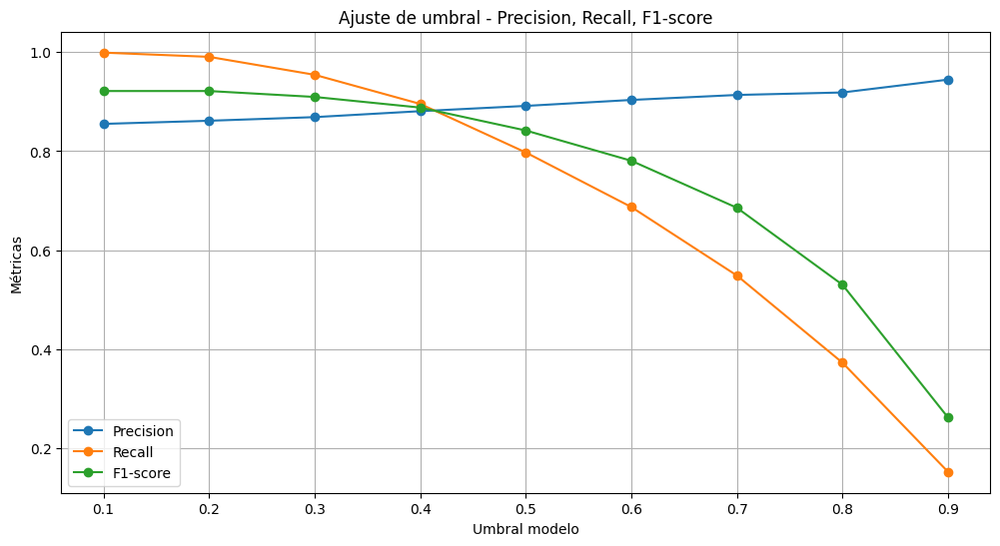

In [527]:
plt.figure(figsize=(12, 6))
plt.plot(thresholds, precisions, label='Precision', marker='o')
plt.plot(thresholds, recalls, label='Recall', marker='o')
plt.plot(thresholds, f1_scores, label='F1-score', marker='o')
plt.xlabel('Umbral modelo')
plt.ylabel('Métricas')
plt.title('Ajuste de umbral - Precision, Recall, F1-score')
plt.legend()
plt.grid(True)
plt.show()

In [528]:
# Coste de un falso positivo (enviar un avión innecesariamente)
cost_fp = 29.98*15  # Coste de enviar un avión segun los datos que tenemos en la introducción de coste hora.
# pongo un *15 porque es la media de las 3 provincias en la comunidad valenciana 

# Estimación del coste de un falso negativo (no enviar un avión cuando es necesario)
cost_fn = (6343*0.07) # Un valor extraido de las hectarias mediana (medias muy altas) quemadas en los datos obtenidos 
#y el coste medio de perdida medio ambiental segúnhttps://evenor-tech.com/el-coste-economico-de-los-incendios-forestales/

thresholds = np.arange(0.1, 1.0, 0.1)
total_costs = []

for threshold in thresholds:
    # Aplicar el umbral para hacer las predicciones ajustadas
    y_pred_adjusted = (preds >= threshold).astype(int)
    
    # Calculoo FP y FN
    false_positive = ((y_pred_adjusted == 1) & (y_test == 0)).sum()
    false_negative = ((y_pred_adjusted == 0) & (y_test == 1)).sum()

    # Coste total
    total_cost = (false_positive * cost_fp) + (false_negative * cost_fn)
    total_costs.append(total_cost)


for i, threshold in enumerate(thresholds):
    print(f"Umbral: {threshold:.1f}, Coste total: {total_costs[i]:.2f} €")

Umbral: 0.1, Coste total: 206400.92 €
Umbral: 0.2, Coste total: 204471.25 €
Umbral: 0.3, Coste total: 229546.53 €
Umbral: 0.4, Coste total: 272262.72 €
Umbral: 0.5, Coste total: 360694.87 €
Umbral: 0.6, Coste total: 464229.05 €
Umbral: 0.7, Coste total: 604206.19 €
Umbral: 0.8, Coste total: 792620.25 €
Umbral: 0.9, Coste total: 1028019.71 €


In [530]:
# Ajuste umbral
threshold = 0.45
y_pred_adjusted = (preds  >= threshold).astype(int)

In [531]:
print(confusion_matrix(y_test, y_pred_adjusted))

print(classification_report(y_test, y_pred_adjusted))

[[ 171  286]
 [ 399 2302]]
              precision    recall  f1-score   support

           0       0.30      0.37      0.33       457
           1       0.89      0.85      0.87      2701

    accuracy                           0.78      3158
   macro avg       0.59      0.61      0.60      3158
weighted avg       0.80      0.78      0.79      3158



In [532]:
filename = '../Modelos/Autobomba/best_lgb_AUTOBOMBA.pkl'
joblib.dump(best_light_gbm, filename)

['../Modelos/Autobomba/best_lgb_AUTOBOMBA.pkl']

In [533]:
model_and_threshold = {
    'model': best_light_gbm,
    'threshold': threshold}

    
joblib.dump(model_and_threshold, filename)

['../Modelos/Autobomba/best_lgb_AUTOBOMBA.pkl']

### 4.3 Cat Boosting

In [534]:

X = data_filtrado[['COMARCA','D_APIE','D_VIENTO','DULLUVIA','difficulty_viento_humedad',
             'ESTACION','FuelLoadIndex','fire_risk_landcover','Humidity (%)','IND_PEL','LandCover',
             'MOD_COM','PART_ASOC','Slope','Temperature (C)','V_VIENTO','X','Y']] 
y = data_filtrado['AUTOBOMBA_CLASS']


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [535]:
catboost_model = CatBoostClassifier(iterations=1000, 
                                    learning_rate=0.1, 
                                    depth=6, 
                                    verbose=200,
                                    random_state=42)

In [536]:
catboost_model.fit(X_train, y_train)

0:	learn: 0.6317536	total: 2.41ms	remaining: 2.4s
200:	learn: 0.2731018	total: 354ms	remaining: 1.41s
400:	learn: 0.1939930	total: 641ms	remaining: 958ms
600:	learn: 0.1458637	total: 923ms	remaining: 613ms
800:	learn: 0.1127292	total: 1.24s	remaining: 308ms
999:	learn: 0.0883105	total: 1.53s	remaining: 0us


In [537]:
print("Precisión sobre el juego de pruebas: {:.4f}"
      .format(catboost_model.score(X_test, y_test)))
print("Precisión sobre el juego de train: {:.4f}"
      .format(catboost_model.score(X_train, y_train)))

Precisión sobre el juego de pruebas: 0.8445
Precisión sobre el juego de train: 0.9893


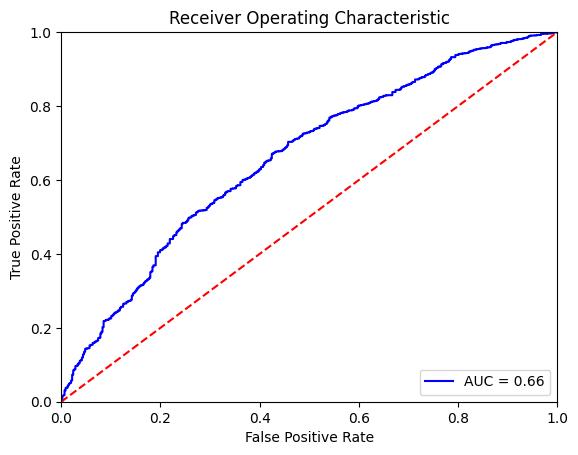

In [538]:
probs = catboost_model.predict_proba(X_test)
preds = probs[:,1]
fpr, tpr, threshold = metrics.roc_curve(y_test, preds)
roc_auc = metrics.auc(fpr, tpr)

plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

In [539]:
predicciones = catboost_model.predict(X_test)

mat_confusion = confusion_matrix(
                    y_true    = y_test,
                    y_pred    = predicciones
                )

accuracy = accuracy_score(
            y_true    = y_test,
            y_pred    = predicciones,
            normalize = True
           )

print("Matriz de confusión")
print(mat_confusion)
print("")
print(f"El accuracy de test es: {100 * accuracy} %")

print(
    classification_report(
        y_true = y_test,
        y_pred = predicciones
    )
)


Matriz de confusión
[[  55  402]
 [  89 2612]]

El accuracy de test es: 84.4521849271691 %
              precision    recall  f1-score   support

           0       0.38      0.12      0.18       457
           1       0.87      0.97      0.91      2701

    accuracy                           0.84      3158
   macro avg       0.62      0.54      0.55      3158
weighted avg       0.80      0.84      0.81      3158



In [540]:

param_grid = {
    'iterations': [100, 200, 300, 500, 1000],
    'depth': [4, 6, 8, 10],
    'learning_rate': [0.01, 0.05, 0.1, 0.15],
    'l2_leaf_reg': [1, 3, 5, 10],  
    'border_count': [32, 64, 128]
}

In [541]:
cat_random = RandomizedSearchCV(estimator = catboost_model, 
                                   param_distributions = param_grid, 
                                   n_iter = 50, 
                                   cv = 5, 
                                   scoring='roc_auc',
                                   verbose=1, 
                                   random_state=42, 
                                   n_jobs = 1)

In [542]:
cat_random.fit(X_train, y_train)

Fitting 5 folds for each of 50 candidates, totalling 250 fits
0:	learn: 0.6865017	total: 3.28ms	remaining: 981ms
200:	learn: 0.3690006	total: 365ms	remaining: 180ms
299:	learn: 0.3452762	total: 534ms	remaining: 0us
0:	learn: 0.6864738	total: 3.02ms	remaining: 902ms
200:	learn: 0.3646937	total: 404ms	remaining: 199ms
299:	learn: 0.3402247	total: 662ms	remaining: 0us
0:	learn: 0.6867412	total: 3.11ms	remaining: 931ms
200:	learn: 0.3689743	total: 544ms	remaining: 268ms
299:	learn: 0.3443495	total: 773ms	remaining: 0us
0:	learn: 0.6865002	total: 1.79ms	remaining: 536ms
200:	learn: 0.3682445	total: 395ms	remaining: 194ms
299:	learn: 0.3439170	total: 562ms	remaining: 0us
0:	learn: 0.6865525	total: 1.61ms	remaining: 481ms
200:	learn: 0.3650185	total: 326ms	remaining: 161ms
299:	learn: 0.3403969	total: 488ms	remaining: 0us
0:	learn: 0.6616755	total: 2.87ms	remaining: 2.87s
200:	learn: 0.3287860	total: 224ms	remaining: 890ms
400:	learn: 0.2765569	total: 444ms	remaining: 664ms
600:	learn: 0.2325

RandomizedSearchCV(cv=5,
                   estimator=<catboost.core.CatBoostClassifier object at 0x3216636e0>,
                   n_iter=50, n_jobs=1,
                   param_distributions={'border_count': [32, 64, 128],
                                        'depth': [4, 6, 8, 10],
                                        'iterations': [100, 200, 300, 500,
                                                       1000],
                                        'l2_leaf_reg': [1, 3, 5, 10],
                                        'learning_rate': [0.01, 0.05, 0.1,
                                                          0.15]},
                   random_state=42, scoring='roc_auc', verbose=1)

In [543]:
best_cat = cat_random.best_estimator_

<BarContainer object of 18 artists>

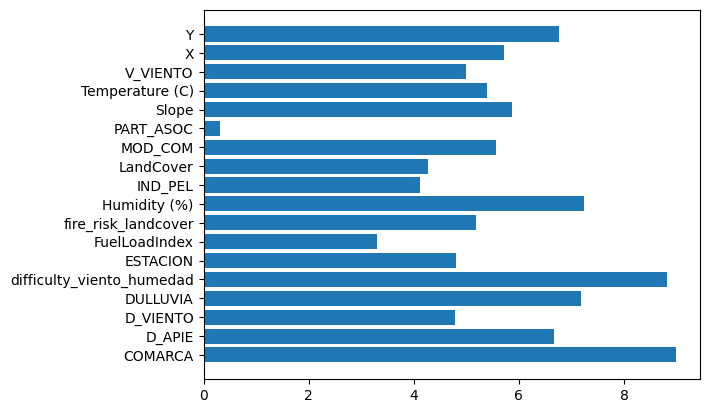

In [544]:
plt.barh(X.columns, best_cat.feature_importances_)

In [545]:
best_cat.fit(X_train,y_train)

0:	learn: 0.6865588	total: 1.97ms	remaining: 1.97s
200:	learn: 0.3845999	total: 283ms	remaining: 1.12s
400:	learn: 0.3603905	total: 524ms	remaining: 782ms
600:	learn: 0.3446667	total: 759ms	remaining: 504ms
800:	learn: 0.3314510	total: 990ms	remaining: 246ms
999:	learn: 0.3188817	total: 1.22s	remaining: 0us


In [546]:
print('BALANCED_ BEST_PARAMS_')

print("Precisión sobre el juego de test: {:.4f}"
      .format(best_cat.score(X_test, y_test)))
print("Precisión sobre el juego de train: {:.4f}"
      .format(best_cat.score(X_train, y_train)))

BALANCED_ BEST_PARAMS_
Precisión sobre el juego de test: 0.8559
Precisión sobre el juego de train: 0.8643


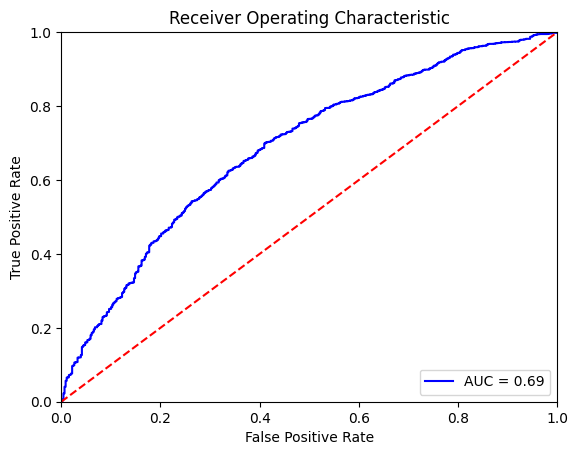

In [552]:
probs = best_cat.predict_proba(X_test)
preds = probs[:,1]
fpr, tpr, threshold = metrics.roc_curve(y_test, preds)
roc_auc = metrics.auc(fpr, tpr)

plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

In [554]:
predicciones = best_cat.predict(X_test)
mat_confusion = confusion_matrix(
                    y_true    = y_test,
                    y_pred    = predicciones
                )

accuracy = accuracy_score(
            y_true    = y_test,
            y_pred    = predicciones,
            normalize = True
           )

print("Matriz de confusión")
print(mat_confusion)
print("")
print(f"El accuracy de test es: {100 * accuracy} %")

print(
    classification_report(
        y_true = y_test,
        y_pred = predicciones
    )
)


Matriz de confusión
[[  18  439]
 [  16 2685]]

El accuracy de test es: 85.59214692843572 %
              precision    recall  f1-score   support

           0       0.53      0.04      0.07       457
           1       0.86      0.99      0.92      2701

    accuracy                           0.86      3158
   macro avg       0.69      0.52      0.50      3158
weighted avg       0.81      0.86      0.80      3158



In [556]:
#Rango umbrales en pasos pequeños
thresholds = np.arange(0.1, 1.0, 0.1)
precisions = []
recalls = []
f1_scores = []

# Metricas por umbral
for threshold in thresholds:
    y_pred_adjusted = (preds >= threshold).astype(int)  # Aplicar el umbral
    precisions.append(precision_score(y_test, y_pred_adjusted))
    recalls.append(recall_score(y_test, y_pred_adjusted))
    f1_scores.append(f1_score(y_test, y_pred_adjusted))

# resultados
for i, threshold in enumerate(thresholds):
    print(f"Umbral: {threshold:.1f}, Precision: {precisions[i]:.4f}, Recall: {recalls[i]:.4f}, F1-score: {f1_scores[i]:.4f}")


Umbral: 0.1, Precision: 0.8553, Recall: 1.0000, F1-score: 0.9220
Umbral: 0.2, Precision: 0.8553, Recall: 1.0000, F1-score: 0.9220
Umbral: 0.3, Precision: 0.8555, Recall: 0.9996, F1-score: 0.9220
Umbral: 0.4, Precision: 0.8565, Recall: 0.9967, F1-score: 0.9213
Umbral: 0.5, Precision: 0.8595, Recall: 0.9941, F1-score: 0.9219
Umbral: 0.6, Precision: 0.8614, Recall: 0.9804, F1-score: 0.9171
Umbral: 0.7, Precision: 0.8755, Recall: 0.9297, F1-score: 0.9018
Umbral: 0.8, Precision: 0.8972, Recall: 0.7949, F1-score: 0.8430
Umbral: 0.9, Precision: 0.9292, Recall: 0.4569, F1-score: 0.6126


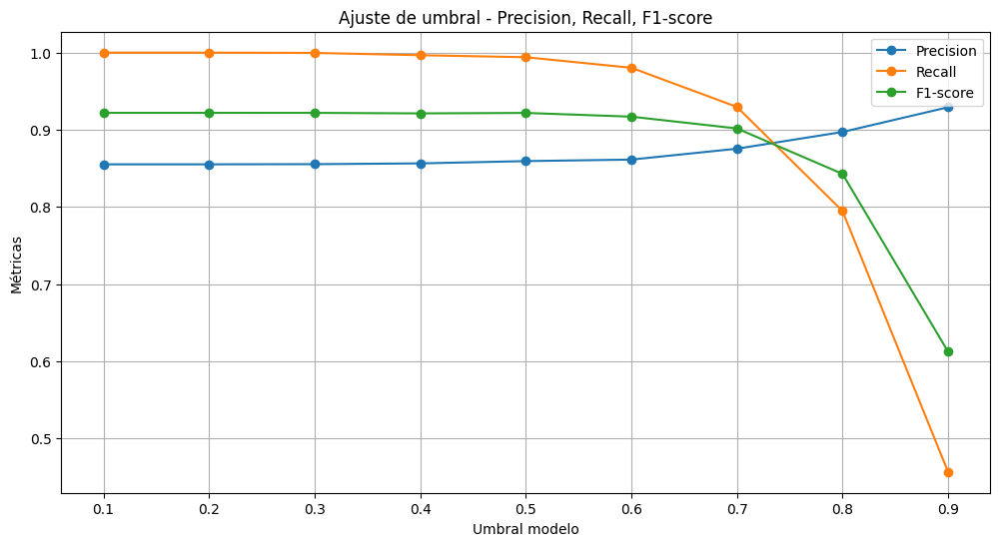

In [558]:
plt.figure(figsize=(12, 6))
plt.plot(thresholds, precisions, label='Precision', marker='o')
plt.plot(thresholds, recalls, label='Recall', marker='o')
plt.plot(thresholds, f1_scores, label='F1-score', marker='o')
plt.xlabel('Umbral modelo')
plt.ylabel('Métricas')
plt.title('Ajuste de umbral - Precision, Recall, F1-score')
plt.legend()
plt.grid(True)
plt.show()


In [560]:
# Coste de un falso positivo (enviar un avión innecesariamente)
cost_fp = 29.98*15  # Coste de enviar un avión segun los datos que tenemos en la introducción de coste hora.
# pongo un *15 porque es la media de las 3 provincias en la comunidad valenciana 

# Estimación del coste de un falso negativo (no enviar un avión cuando es necesario)
cost_fn = (6343*0.07) # Un valor extraido de las hectarias mediana (medias muy altas) quemadas en los datos obtenidos 
#y el coste medio de perdida medio ambiental segúnhttps://evenor-tech.com/el-coste-economico-de-los-incendios-forestales/

thresholds = np.arange(0.1, 1.0, 0.1)
total_costs = []

for threshold in thresholds:
    # Aplicar el umbral para hacer las predicciones ajustadas
    y_pred_adjusted = (preds >= threshold).astype(int)
    
    # Calculoo FP y FN
    false_positive = ((y_pred_adjusted == 1) & (y_test == 0)).sum()
    false_negative = ((y_pred_adjusted == 0) & (y_test == 1)).sum()

    # Coste total
    total_cost = (false_positive * cost_fp) + (false_negative * cost_fn)
    total_costs.append(total_cost)


for i, threshold in enumerate(thresholds):
    print(f"Umbral: {threshold:.1f}, Coste total: {total_costs[i]:.2f} €")


Umbral: 0.1, Coste total: 205512.90 €
Umbral: 0.2, Coste total: 205512.90 €
Umbral: 0.3, Coste total: 205507.21 €
Umbral: 0.4, Coste total: 206810.79 €
Umbral: 0.5, Coste total: 204522.46 €
Umbral: 0.6, Coste total: 215104.73 €
Umbral: 0.7, Coste total: 244904.80 €
Umbral: 0.8, Coste total: 356607.74 €
Umbral: 0.9, Coste total: 693634.47 €


In [566]:
# Ajuste umbral
threshold = 0.8
y_pred_adjusted = (preds  >= threshold).astype(int)

In [567]:
print(confusion_matrix(y_test, y_pred_adjusted))

print(classification_report(y_test, y_pred_adjusted))



[[ 211  246]
 [ 554 2147]]
              precision    recall  f1-score   support

           0       0.28      0.46      0.35       457
           1       0.90      0.79      0.84      2701

    accuracy                           0.75      3158
   macro avg       0.59      0.63      0.59      3158
weighted avg       0.81      0.75      0.77      3158



In [568]:
filename = '../Modelos/Autobomba/best_cat_AUTOBOMBA.pkl'

In [569]:
model_and_threshold = {
    'model': best_cat,
    'threshold': threshold}

    
joblib.dump(model_and_threshold, filename)

['../Modelos/Autobomba/best_cat_AUTOBOMBA.pkl']

### Ejemplo uso practico

Lo hago con el mejor de todos que ha sido el best_light_gbm

In [ ]:

def aviondescarga(data):
    """
    Función para predecir si se debe enviar un avión basado en las características dadas.

    Args:
        data (dict): dar un diccionario con las siguientes claves:
            ['Slope', 'TEMPMAX', 'V_VIENTO', 'H_RELAT', 'DifficultyIndex',
            'Elevation', 'TOT_EST', 'ENP_1', 'EIMP_GLOB', 'SHAPE_AREA',
            'BOMBEROS', 'GUARCIVIL', 'F_EJERCIT', 'OPERCIV', 'VOLUN_ORG', 'TECNICOS']

   
    """
    # Asegurarse de que los datos están en el orden correcto
    features = ['Slope', 'TEMPMAX', 'V_VIENTO', 'H_RELAT', 'DifficultyIndex',
                'Elevation', 'TOT_EST', 'ENP_1', 'EIMP_GLOB', 'SHAPE_AREA',
                'BOMBEROS', 'GUARCIVIL'] #, 'F_EJERCIT', 'OPERCIV', 'VOLUN_ORG', 'TECNICOS'

    try:
        # ordeanar
        input_data = np.array([data[feature] for feature in features]).reshape(1, -1)

        # P.modelo
        probability = best_model.predict_proba(input_data)[0, 1]  

        # Metemos recomendación un umbral de probabilidad del 80%
        recommendation = "Si, enviar" if probability >= 0.8 else "No, no enviar"

        return {
            "probability": probability,
            "recommendation": recommendation
        }

    except KeyError as e:
        return {"error": f"Falta la característica requerida: {e}"}
    except Exception as e:
        return {"error": f"Ocurrió un error: {e}"}


In [ ]:
# Carga el modelo con joblib
best_model = load('./Modelos/Aviones_descarga/best_light_gbm(2).pkl')

data = {
    'Slope': 11,
    'TEMPMAX': 18,
    'V_VIENTO': 5,
    'H_RELAT': 82,
    'DifficultyIndex': 0,
    'Elevation': 500.0,
    'TOT_EST': 10,
    'ENP_1': 0,
    'EIMP_GLOB': 3,
    'SHAPE_AREA': 214534.97,
    'BOMBEROS': 4,
    'GUARCIVIL': 14
    

}

In [ ]:
result = aviondescarga(data)
print(result)


{'probability': 0.6927540949712792, 'recommendation': 'No, no enviar'}


## Modelos Regresión

una vez que sabemos si necesitamos o no Helicopteros de descarga lo siguiente que tenemos que saber en cada situcion cuantos necesitaríamos


In [171]:

X = data_filtrado[['COMARCA','DifficultyIndex','difficulty_viento_humedad','D_APIE','D_VIENTO','DULLUVIA','Elevation',
                   'FuelLoadIndex','Humidity (%)','IND_PEL','LandCover','MOD_COM',
                   'Slope','Temperature (C)','V_VIENTO','X','Y']] 
y = data_filtrado['AUTOBOMBA']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

### Random Forest

Va a ser el primer modelo que usamos para poder hacer un aprendizaje supervisado para ello pasaremos de una primera configuracion donde no vamos a ajustar el modelo si no que lo dejamos de fabrica y luego vamos a intentar ajustar los hiperparametros para poder mejorar las metricas de este y que el test y train mejore a la par y no que haya un sobre ajuste que suele producirse 

Pruebo a hacer el random Forest con los datos predeterminados 

In [172]:
# Modelo de Random Forest Regressor
forest = RandomForestRegressor(random_state=123)


In [173]:
forest.fit(X_train, y_train)

RandomForestRegressor(random_state=123)

Como no hemos aplicado el cross validation se produce un sobreajuste de los datos por lo tanto a partir de ahora es cuando se juega con lo parametros para conseguir mejores valores

In [174]:

# Evaluar el modelo inicial
y_pred = forest.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"MSE del modelo inicial: {mse}")
print(f"MAE del modelo inicial: {mae}")
print(f"R2 del modelo inicial: {r2}")



MSE del modelo inicial: 11.994389665727176
MAE del modelo inicial: 1.6433508912187664
R2 del modelo inicial: 0.2982086907805924


In [175]:
# Hiperparametros
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [ None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': [5, 7, 9]
}



In [176]:
combinaciones = ParameterGrid(param_grid)

In [177]:
# Diccionario para almacenar los resultados
resultados = {'params': [], 'mse': [], 'mae': [], 'r2': []}

# Entreno del modelo por parametros

for params in combinaciones:
    modelo = RandomForestRegressor(
        random_state=123,
        **params
    )

    # Entrenar el modelo
    modelo.fit(X_train, y_train)
    y_pred = modelo.predict(X_test)

    # Calcular métricas
    mse = mean_squared_error(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    # Guardar los resultados
    resultados['params'].append(params)
    resultados['mse'].append(mse)
    resultados['mae'].append(mae)
    resultados['r2'].append(r2)

In [178]:

resultados_df = pd.DataFrame(resultados)
resultados_df = pd.concat([resultados_df, resultados_df['params'].apply(pd.Series)], axis=1)
resultados_df = resultados_df.drop(columns='params')
resultados_df = resultados_df.sort_values('mse', ascending=True)  # Ordenar por menor MSE

resultados_df.head()


,mse,mae,r2,max_depth,max_features,min_samples_leaf,min_samples_split,n_estimators
191,11.751013,1.603547,0.312449,20.0,7.0,1.0,2.0,200.0
218,11.795237,1.610905,0.309861,20.0,9.0,1.0,2.0,200.0
190,11.863948,1.615855,0.305841,20.0,7.0,1.0,2.0,100.0
137,11.922737,1.578893,0.302401,10.0,9.0,1.0,2.0,200.0
83,11.930346,1.560021,0.301956,10.0,5.0,1.0,2.0,200.0


In [179]:
mejores_params = resultados_df.iloc[0].drop(['mse', 'mae', 'r2']).to_dict()
for key, value in mejores_params.items():
    if isinstance(value, float) and value.is_integer():
        mejores_params[key] = int(value)
        
modelo_final = RandomForestRegressor(random_state=123, **mejores_params)
modelo_final.fit(X_train, y_train)



RandomForestRegressor(max_depth=20, max_features=7, n_estimators=200,
                      random_state=123)

In [180]:
# modelo final
y_pred_final = modelo_final.predict(X_test)
mse_final = mean_squared_error(y_test, y_pred_final)
mae_final = mean_absolute_error(y_test, y_pred_final)
r2_final = r2_score(y_test, y_pred_final)


print(f"MSE del modelo final: {mse_final}")
print(f"MAE del modelo final: {mae_final}")
print(f"R2 del modelo final: {r2_final}")

MSE del modelo final: 11.751013137904831
MAE del modelo final: 1.6035474042190083
R2 del modelo final: 0.3124486426959251


Ahora voy a intentar mejorar el modelo con los hiperparametros antes de empezar a a usar nueva variables

Importancia de las características en el modelo Random Forest:
                           Importancia
COMARCA                       0.039987
DifficultyIndex               0.037475
difficulty_viento_humedad     0.059707
D_APIE                        0.016685
D_VIENTO                      0.037947
DULLUVIA                      0.052391
Elevation                     0.050495
FuelLoadIndex                 0.028249
Humidity (%)                  0.176051
IND_PEL                       0.040394
LandCover                     0.024050
MOD_COM                       0.077972
Slope                         0.073017
Temperature (C)               0.075342
V_VIENTO                      0.068771
X                             0.078808
Y                             0.062659


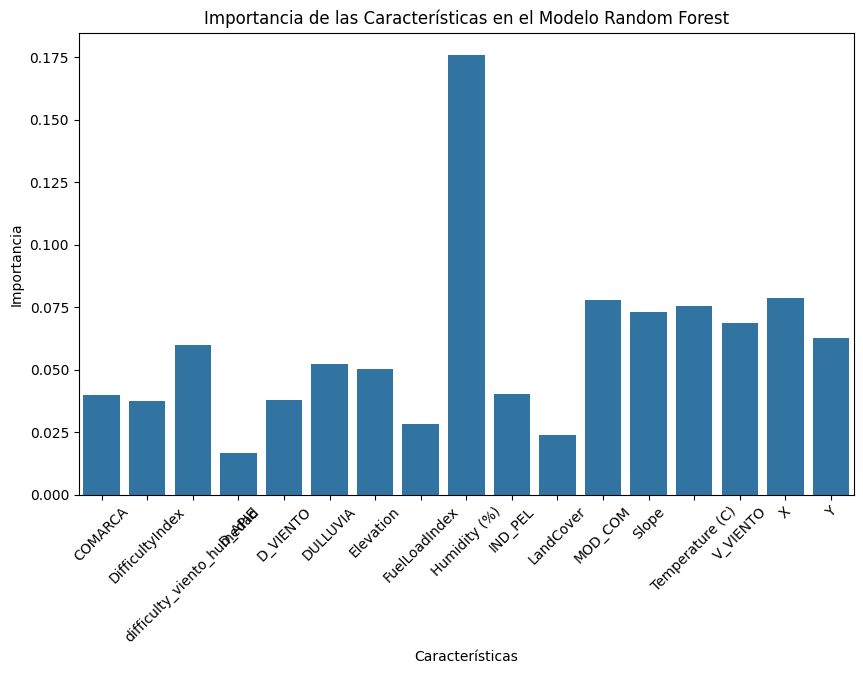

In [181]:

# Importancia de las características en el modelo Random Forest
feature_importances = forest.feature_importances_
feature_importance_df = pd.DataFrame(feature_importances, index=X.columns, columns=['Importancia'])
print('Importancia de las características en el modelo Random Forest:')
print(feature_importance_df)

# Graficar la importancia de las características en el modelo Random Forest
plt.figure(figsize=(10, 6))
sns.barplot(x=feature_importance_df.index, y=feature_importance_df['Importancia'])
plt.title('Importancia de las Características en el Modelo Random Forest')
plt.xlabel('Características')
plt.ylabel('Importancia')
plt.xticks(rotation = 45)
plt.show()


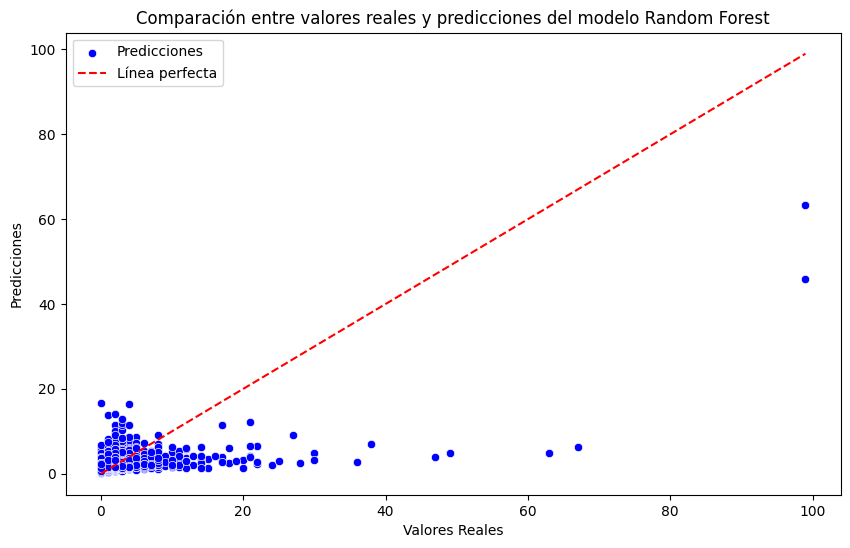

In [182]:
# Crear un DataFrame con las predicciones y los valores reales
predictions_df = pd.DataFrame({'Real': y_test, 'Predicción': y_pred_final})

# Graficar la comparación entre los valores reales y las predicciones
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Real', y='Predicción', data=predictions_df, color='blue', label='Predicciones')
plt.plot([predictions_df['Real'].min(), predictions_df['Real'].max()],
         [predictions_df['Real'].min(), predictions_df['Real'].max()],
         color='red', linestyle='--', label='Línea perfecta')

# Etiquetas y título
plt.title('Comparación entre valores reales y predicciones del modelo Random Forest')
plt.xlabel('Valores Reales')
plt.ylabel('Predicciones')
plt.legend()

# Mostrar gráfico
plt.show()


In [183]:
filename = '../Modelos/Aviones_descarga/Autobomba.pkl'
joblib.dump(modelo_final, filename)
    

['../Modelos/Aviones_descarga/Autobomba.pkl']